### Mask R-CNN on Unreal Dataset

This notebook is used to demonstrate the applicaiton of Mask R-CNN to simulation images from the unreal engine.

In [1]:
import os, argparse
import model as modellib # Mask RCNN
import visualize
from unreal_config  import UnrealConfig
from unreal_dataset import UnrealDataset
from unreal_utils   import MODEL_DIR, limit_GPU_usage, compute_mean_AP
from pathlib import Path

%matplotlib inline 

/home/naoki/miniconda3/envs/test_env/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


### Dataset

In [2]:
HOME_DIR = str(Path.home())
#TODO test set should be different from the validation set
OBJECT_DESC_PATH = '{}/datasets/unreal/unreal dataset 2/objects_description.json'.format(HOME_DIR)
IMAGES_PATH      = '{}/datasets/unreal/unreal dataset 2/images'.format(HOME_DIR)

dataset_test = UnrealDataset()
dataset_test.populate(OBJECT_DESC_PATH, IMAGES_PATH)
dataset_test.prepare()

In [3]:
def show_some_example(dataset, image_id=0):
    """ show some example from a given dataset
    """
    image = dataset.load_image(image_id)
    info  = dataset.image_info[image_id]
    
    instance_path = info['instance_path']
    instance_image = imageio.imread(instance_path)

    masks, class_ids = dataset.load_mask(image_id)

    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()

    plt.figure(figsize=(10,10))
    plt.imshow(instance_image)
    plt.show()

    for i in range(masks.shape[2]):            
        plt.figure(figsize=(10,10))
        plt.imshow(masks[:,:,i])
        plt.title(str(class_ids[i]))
        plt.show()

In [4]:
#show_some_example(dataset_test, 63)
#show_some_example(dataset_test, 39)

### Config

In [5]:
class InferenceConfig(UnrealConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
config = InferenceConfig()
config.display()


Configurations:
BACKBONE_SHAPES                [[256 256]
 [128 128]
 [ 64  64]
 [ 32  32]
 [ 16  16]]
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
CLASS_NAMES                    ['Pedestrian', 'Vehicles']
CLASS_NAME_TO_ID               {'Vehicles': '2', 'Pedestrian': '1'}
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
GPU_COUNT                      1
IMAGES_PER_GPU                 1
IMAGE_MAX_DIM                  1024
IMAGE_MIN_DIM                  1024
IMAGE_PADDING                  True
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
MASK_POOL_SIZE                 14
MASK_SHAPE                     [28, 28]
MAX_GT_INSTANCES               100
MEAN_PIXEL                     [123.7 116.8 103.9]
MINI_MASK_SHAPE                (56, 56)
NAME                           Unreal
N

### Model inference

In [6]:
WEIGHT_PATH='unreal_model_weights.h5'

limit_GPU_usage()
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)
model.load_weights(WEIGHT_PATH, by_name=True)

In [21]:
# evaluate on the validation set with x number of images    
mean_AP = compute_mean_AP(model, config, dataset_test, 10)   
print("mAP: ", mean_AP)

mAP:  0.20711400202616598


### Detection Outputs

In [15]:
def test_model(model, image_id):
    image = dataset_test.load_image(image_id)
    results = model.detect([image], verbose=1)
    r = results[0]
    visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            ['N/A'] + config.CLASS_NAMES, r['scores'])

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


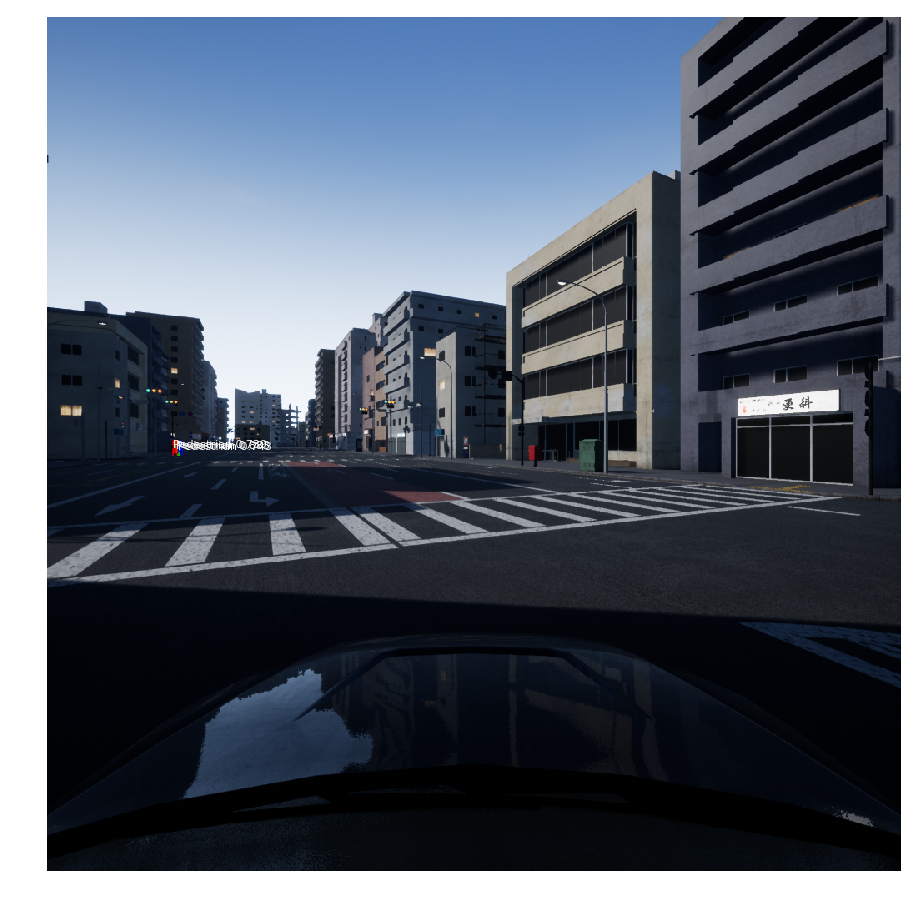

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  254.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


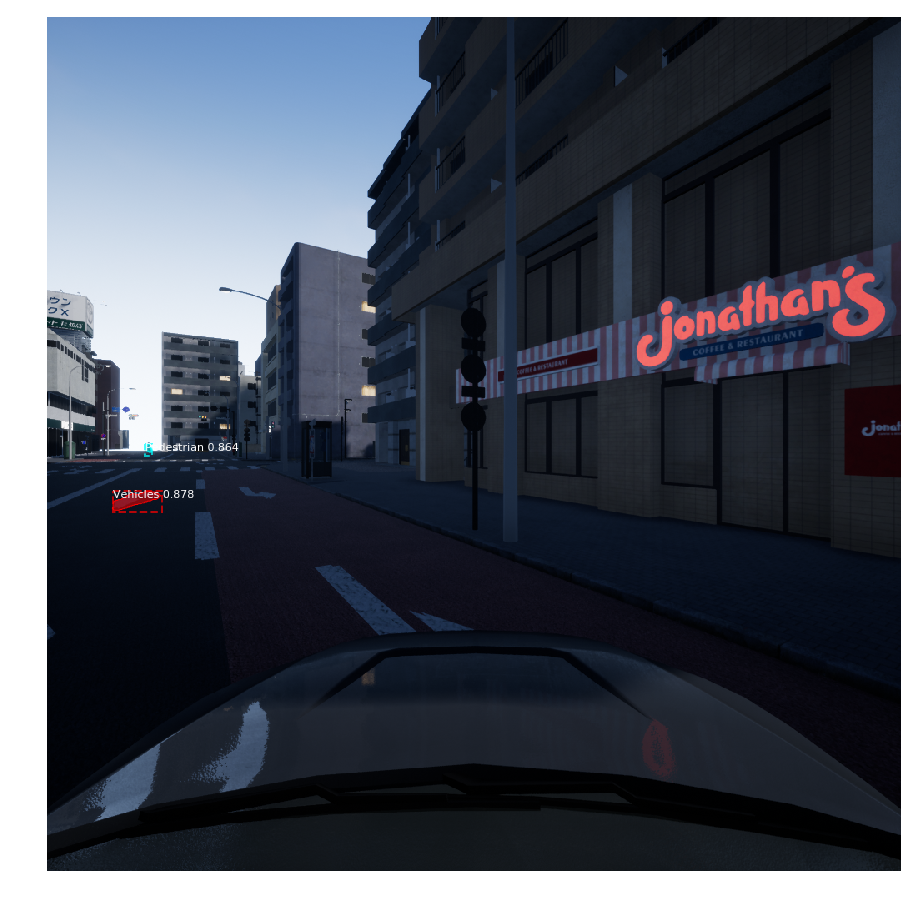

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  150.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


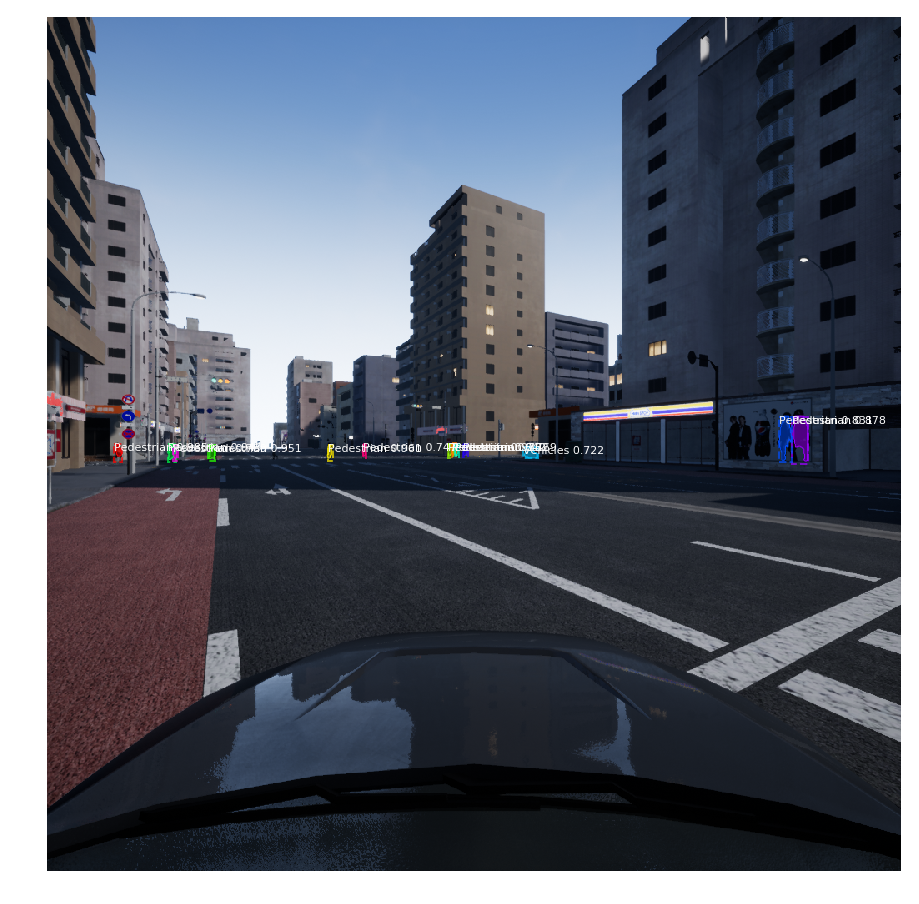

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


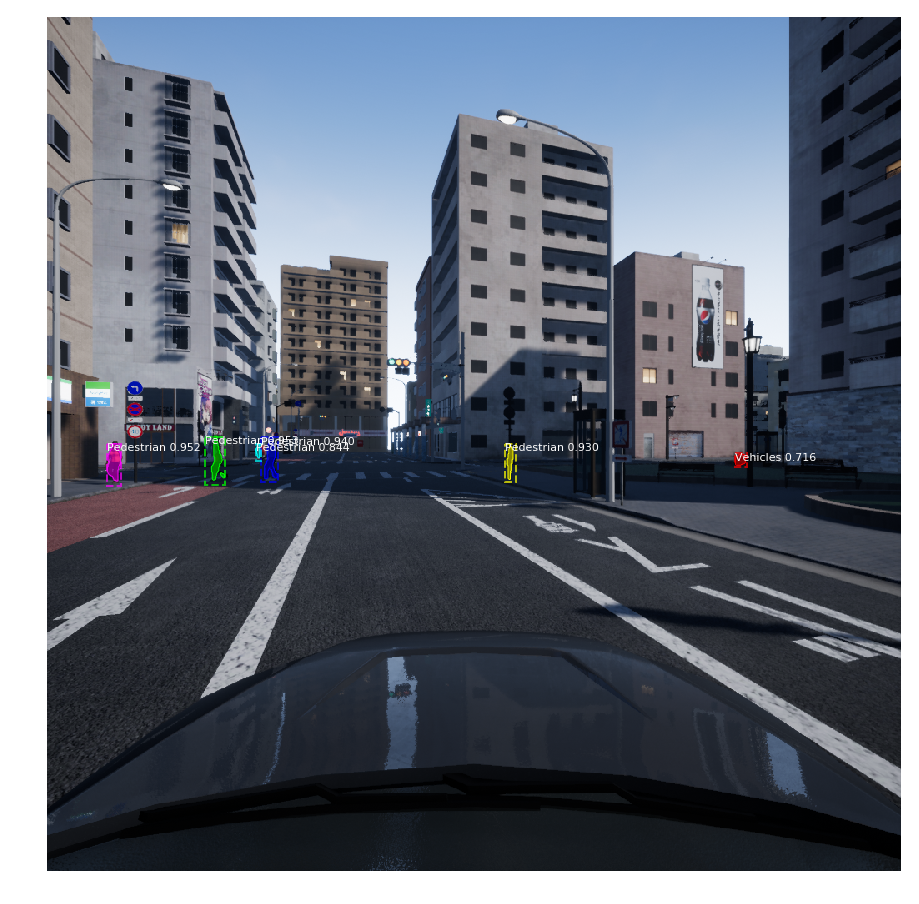

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    1.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -122.70000  max:  148.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


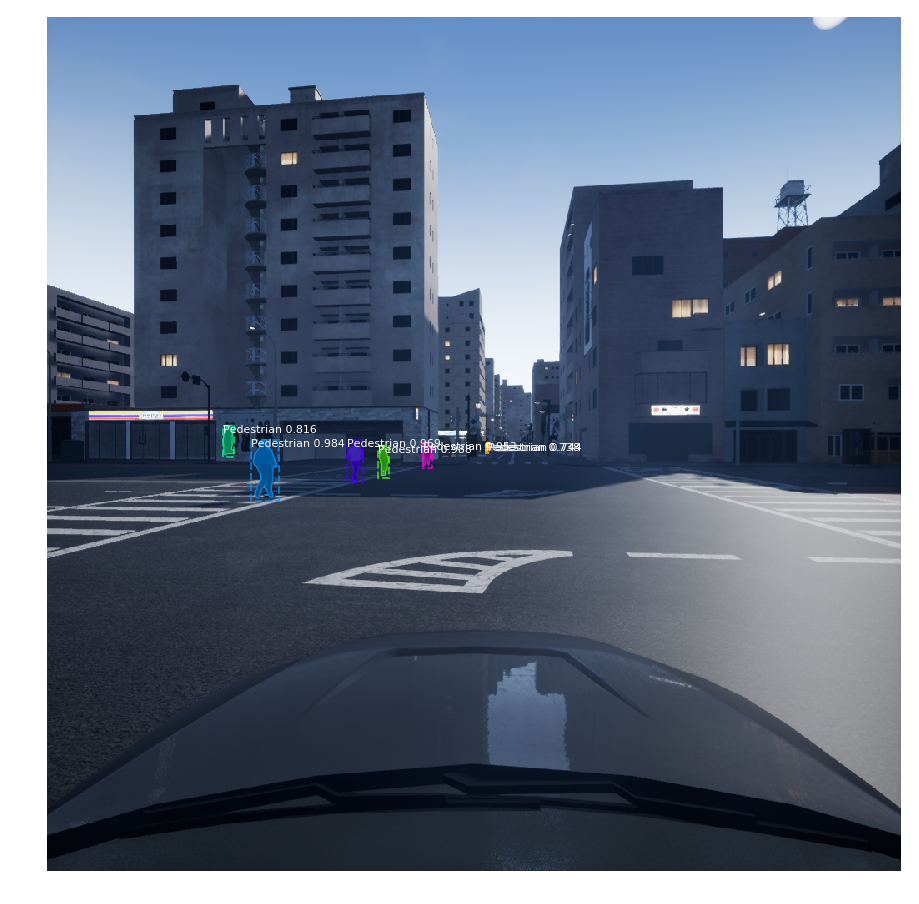

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  148.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


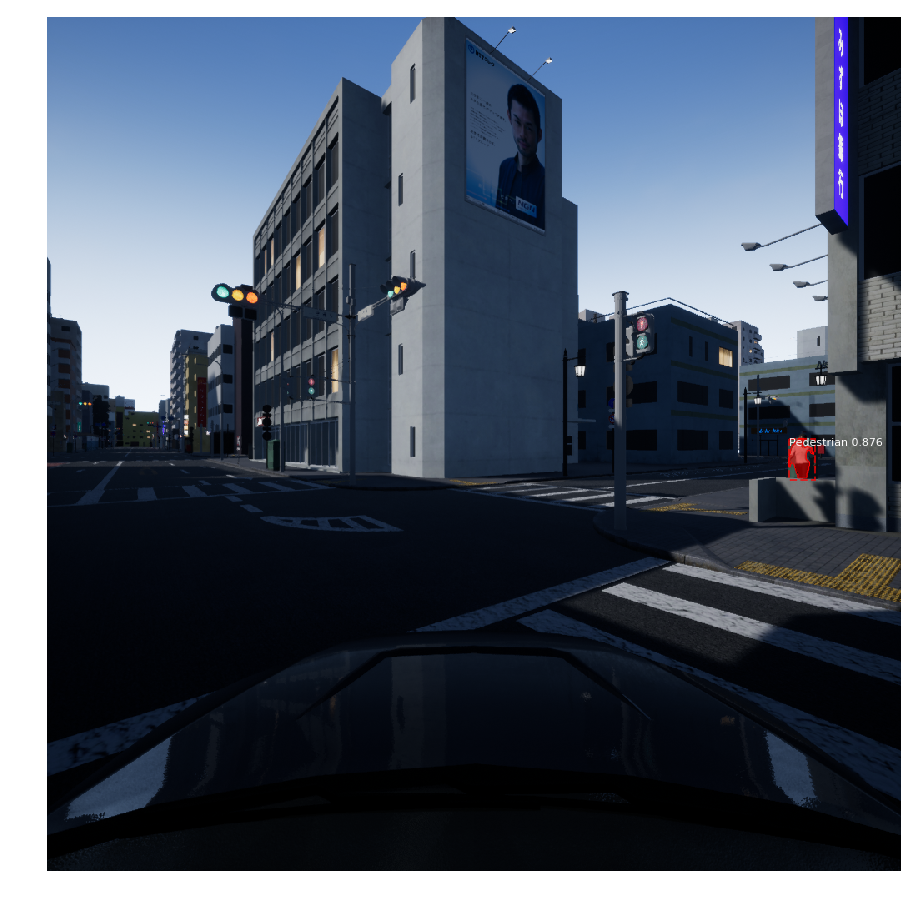

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


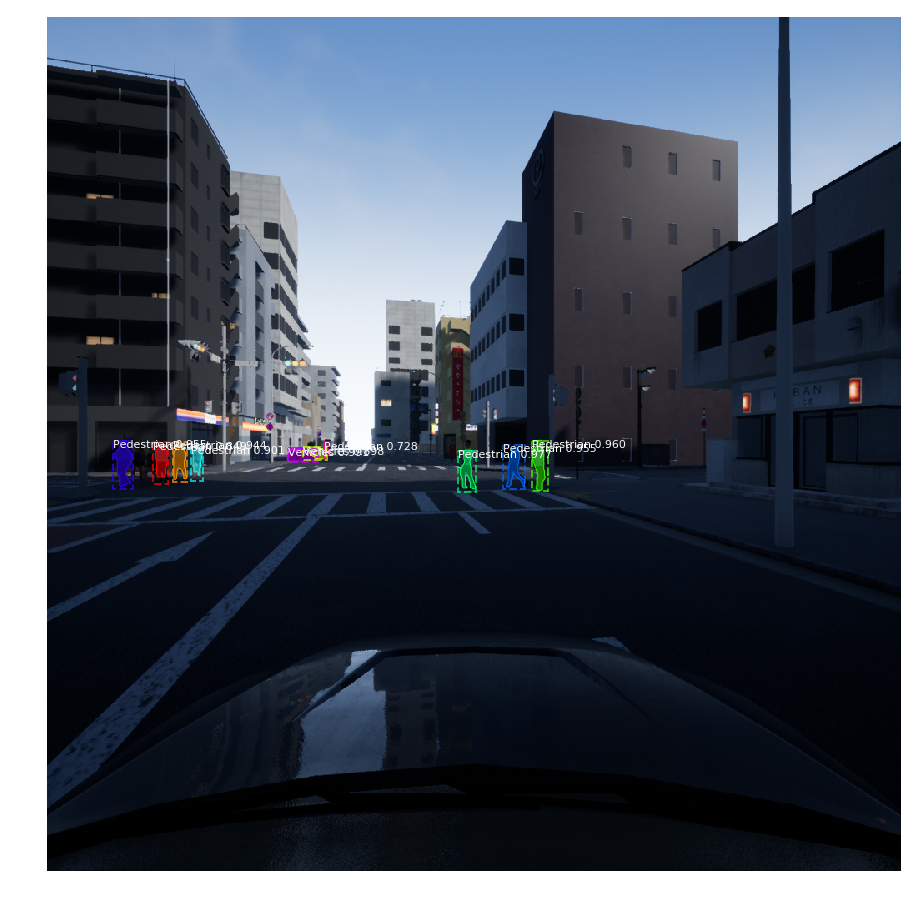

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


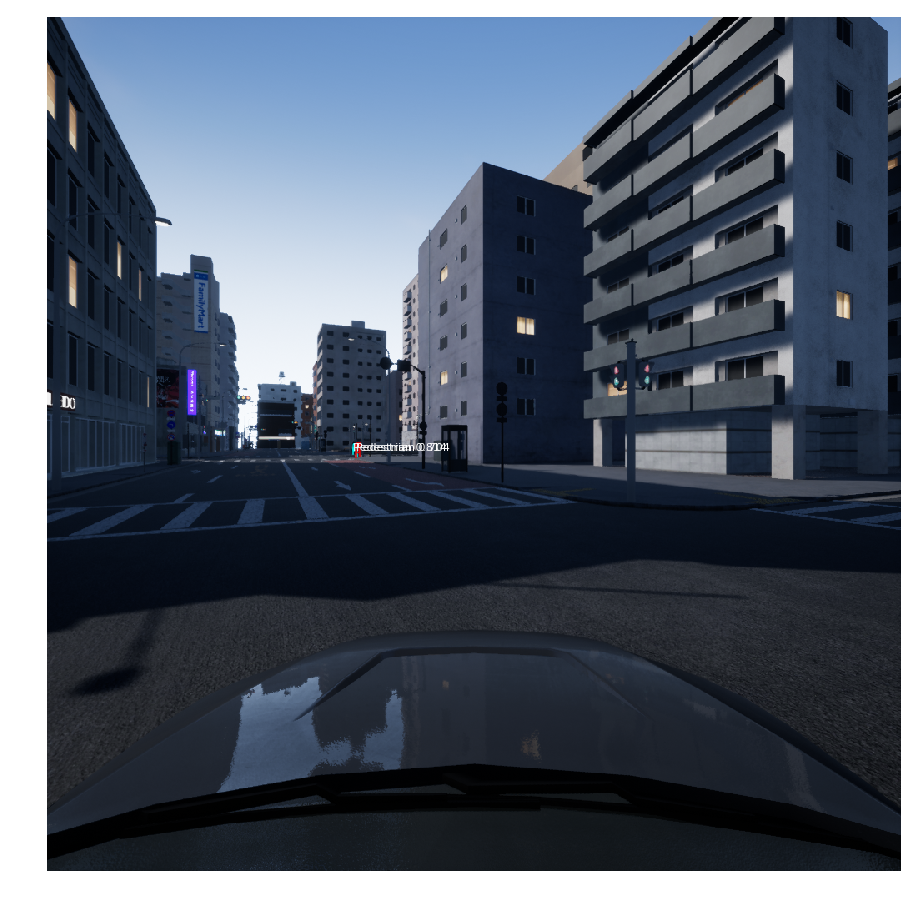

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  149.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


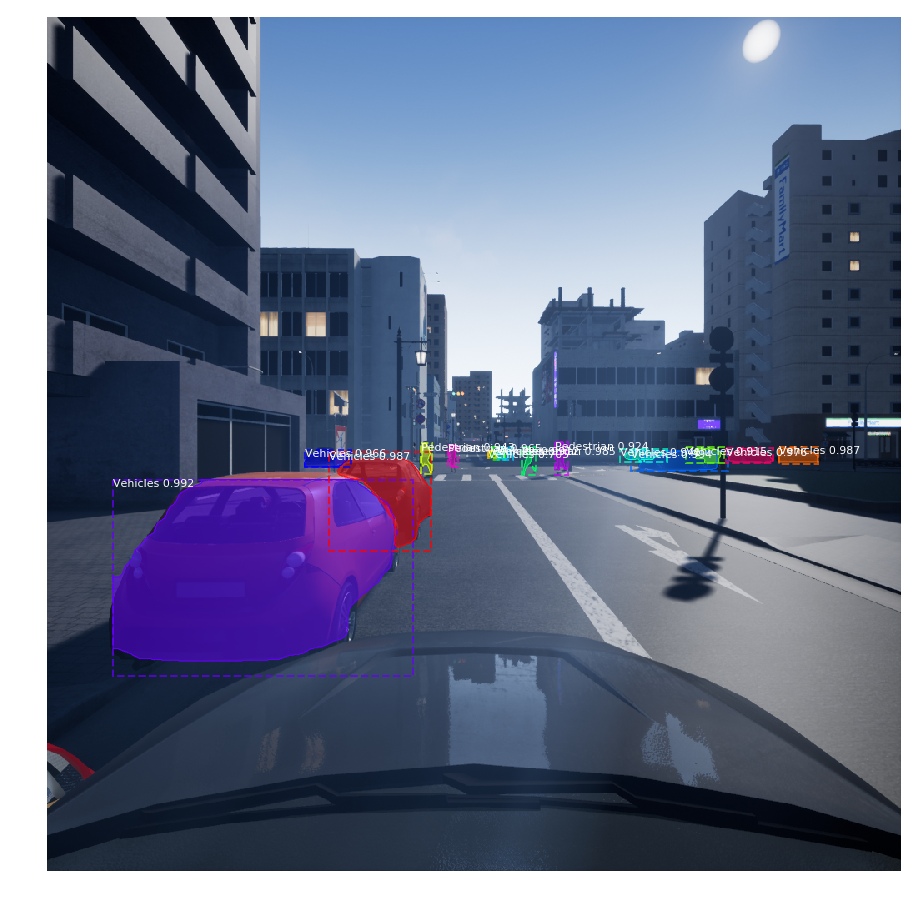

Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000
image_metas              shape: (1, 12)               min:    0.00000  max: 1024.00000


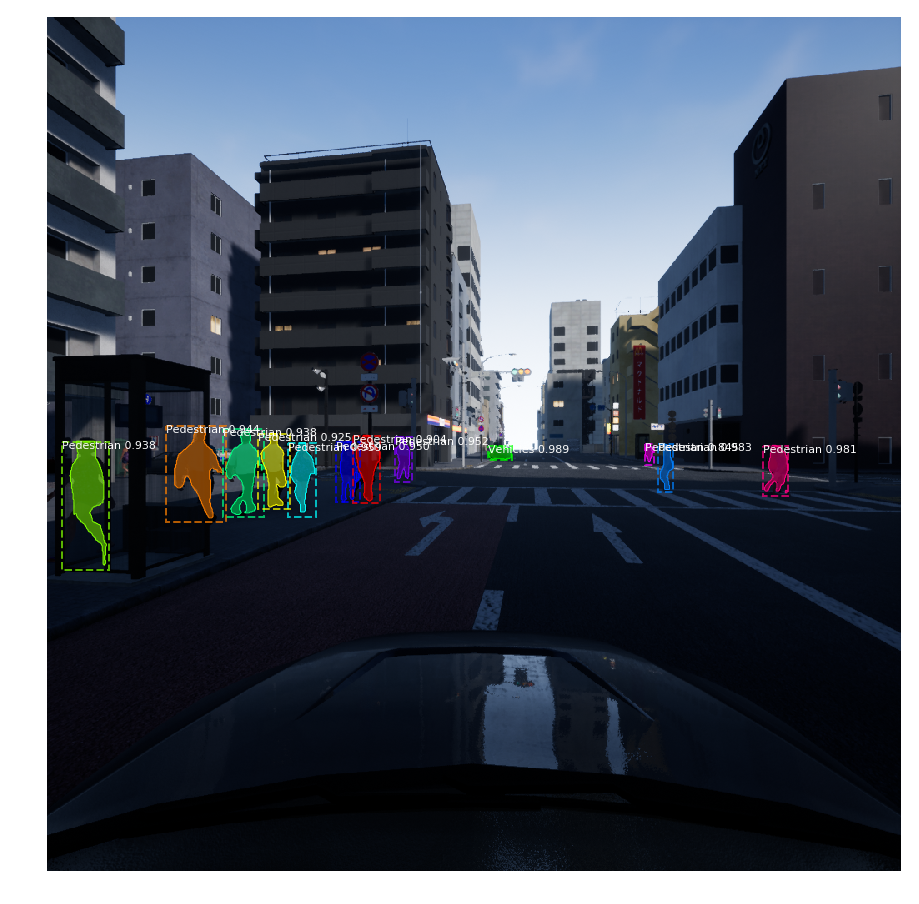

In [19]:
for i in range(10):
    test_model(model, i)